## Lab 4.1 – Polyp detection: YOLO8 (Ultralytics hub)
This notebook is used to evaluate the performance of polyp detection models trained on Ultralytics hub.

This example code will consist of:

1. **Setup**
2. **Load Dataset**
3. **Load Model**
4. **Inference & Evaluate**

## 1) Setup
The code below install and import all required libraries and defines utility functions that will be used in the rest of this notebook.

In [1]:
# Download library
!pip install ultralytics opencv-python tqdm matplotlib -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 22.1 MB/s eta 0:00:00


In [2]:
# Import library
import os
import shutil
import yaml
import time
import random
from glob import glob
from tqdm import tqdm

import numpy as np
import pandas as pd
import cv2
from IPython.display import Video
import matplotlib.pyplot as plt
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## 2) Load Dataset
In this step, the dataset is downloaded from GitHub. The dataset structure is prepared in a format compatible with YOLO. Please refer to the following paths: /content/detect/

In [4]:
!wget https://github.com/pvateekul/digitalhealth-ai2025/raw/main/code/Class04_YOLO/polyp_detect.zip
!unzip -q -o 'polyp_detect.zip'

--2026-01-10 09:23:24--  https://github.com/pvateekul/digitalhealth-ai2025/raw/main/code/Class04_YOLO/polyp_detect.zip
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/pvateekul/digitalhealth-ai2025/main/code/Class04_YOLO/polyp_detect.zip [following]
--2026-01-10 09:23:24--  https://media.githubusercontent.com/media/pvateekul/digitalhealth-ai2025/main/code/Class04_YOLO/polyp_detect.zip
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 33504992 (32M) [application/zip]
Saving to: ‘polyp_detect.zip.1’

polyp_detect.zip.1  100%[===================>]  31.95M  54.1MB/s    in 0.6s    

202

## 3) Load Model
Load models trained on ultralytics hub

In [5]:
# Upload the pt file exported from ultralytics hub
#!wget https://github.com/pvateekul/digitalhealth-ai2025/raw/main/code/Class04_YOLO/YOLOv8_polyp_detection.pt # Comment this line if you want to upload your own file.
#model = YOLO("YOLOv8_polyp_detection.pt")
model = YOLO("your_model")

## 4) Inference & Evaluate


0: 320x320 1 polyp, 9.3ms
Speed: 1.5ms preprocess, 9.3ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 320)


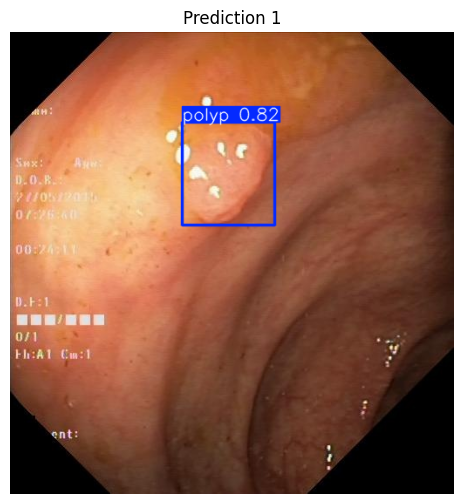

In [12]:
# Inference (image)
test_imgs = glob("detect/images/test/*.jpg")[:1]
results = model.predict(test_imgs, conf=0.3)

for i, r in enumerate(results):
    img = r.plot()[:, :, ::-1]
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Prediction {i+1}")
    plt.show()

In [32]:
# results(Boxes)
results[0].boxes.data # [x1,y1,x2,y2, confidence score,class]

tensor([[197.8405, 103.0560, 303.7986, 221.0303,   0.8173,   0.0000]], device='cuda:0')

In [33]:
# Define IOU bbox
def bbox_iou(box1, box2):
    """
    box: [x1, y1, x2, y2]
    """
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter = max(0, x2 - x1) * max(0, y2 - y1)

    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])

    union = area1 + area2 - inter
    return inter / union if union > 0 else 0

In [34]:
# Evaluate
# Mean IoU
test_imgs = glob("detect/images/test/*.jpg") + glob("detect/images/test/*.png")
print(f"Testing {len(test_imgs)} test images...")

ious, times = [], []

for img_path in tqdm(test_imgs, desc="Evaluating YOLOv8 Detection"):
    img = cv2.imread(img_path)
    if img is None:
        continue

    # Inference
    start = time.time()
    results = model.predict(img, conf=0.3, verbose=False)
    times.append(time.time() - start)

    # No detection
    if results[0].boxes is None or len(results[0].boxes) == 0:
        continue

    # Use bbox with the highest confidence level.
    pred_box = results[0].boxes.xyxy[0].cpu().numpy()

    # -------------------------
    # Load GT bounding box
    # -------------------------
    label_path = os.path.join(
        "/content/detect/labels/test",
        os.path.splitext(os.path.basename(img_path))[0] + ".txt"
    )
    if not os.path.exists(label_path):
        continue

    with open(label_path) as f:
        gt = f.readline().strip().split()

    # YOLO format → xyxy
    cls, xc, yc, w, h = map(float, gt)

    H, W = img.shape[:2]
    gt_box = [
        (xc - w / 2) * W,
        (yc - h / 2) * H,
        (xc + w / 2) * W,
        (yc + h / 2) * H,
    ]

    iou = bbox_iou(pred_box, gt_box)
    ious.append(iou)

print("\n YOLOv8 Detection Performance:")
print(f"• Mean IoU: {np.mean(ious):.4f}")
print(f"• Avg inference time: {np.mean(times)*1000:.2f} ms/img")

Testing 100 test images...


Evaluating YOLOv8 Detection: 100%|██████████| 100/100 [00:01<00:00, 90.31it/s]


 YOLOv8 Detection Performance:
• Mean IoU: 0.8022
• Avg inference time: 8.86 ms/img


In [ ]:
# Download video
!wget https://github.com/pvateekul/digitalhealth-ai2025/raw/main/code/Class04_YOLO/video.mp4

--2026-01-02 08:23:39--  https://github.com/pvateekul/digitalhealth-ai2025/raw/main/code/Class04_YOLO/video.mp4
Resolving github.com (github.com)... 140.82.116.3
Connecting to github.com (github.com)|140.82.116.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/pvateekul/digitalhealth-ai2025/main/code/Class04_YOLO/video.mp4 [following]
--2026-01-02 08:23:39--  https://raw.githubusercontent.com/pvateekul/digitalhealth-ai2025/main/code/Class04_YOLO/video.mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4496629 (4.3M) [application/octet-stream]
Saving to: ‘video.mp4’

video.mp4           100%[===================>]   4.29M  --.-KB/s    in 0.06s   

2026-01-02 08:23:40 (77.0 MB/s) - ‘video.mp4’ sa

In [ ]:
# Inference (video)
cap = cv2.VideoCapture("video.mp4")

w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

out = cv2.VideoWriter(
    "output.mp4",
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (w, h)
)

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model(frame, conf=0.3)[0]

    annotated = results.plot()  # bbox
    out.write(annotated)

cap.release()
out.release()

In [ ]:
!ffmpeg -i /content/output.mp4 -vcodec libx264 -acodec aac /content/output_fixed.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
Video("video.mp4", embed=True)

In [ ]:
Video("output_fixed.mp4", embed=True)